In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
data = pd.read_csv(r"C:\Users\Asus\Downloads\healthcare_dataset.csv")

In [4]:
data

,Patient,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby Jackson,30,Male,B-,Cancer,1/31/2024,Matthew Smith,Sons and Miller,Blue Cross,18856.281310,328,Urgent,2/2/2024,Paracetamol,Normal
1,Leslie Terry,62,Male,A+,Obesity,8/20/2019,Samantha Davies,Kim Inc,Medicare,33643.327290,265,Emergency,8/26/2019,Ibuprofen,Inconclusive
2,Danny Smith,76,Female,A-,Obesity,9/22/2022,Tiffany Mitchell,Cook PLC,Aetna,27955.096080,205,Emergency,10/7/2022,Aspirin,Normal
3,Andrew Watts,28,Female,O+,Diabetes,11/18/2020,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,12/18/2020,Ibuprofen,Abnormal
4,Adrienne Bell,43,Female,AB+,Cancer,9/19/2022,Kathleen Hanna,White-White,Aetna,14238.317810,458,Urgent,10/9/2022,Penicillin,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55495,Elizabeth Jackson,42,Female,O+,Asthma,8/16/2020,Joshua Jarvis,Jones-Thompson,Blue Cross,2650.714952,417,Elective,9/15/2020,Penicillin,Abnormal
55496,Kyle Perez,61,Female,AB-,Obesity,1/23/2020,Taylor Sullivan,Tucker-Moyer,Cigna,31457.797310,316,Elective,2/1/2020,Aspirin,Normal
55497,Heather Wang,38,Female,B+,Hypertension,7/13/2020,Joe Jacobs DVM,"and Mahoney Johnson Vasquez,",UnitedHealthcare,27620.764720,347,Urgent,8/10/2020,Ibuprofen,Abnormal
55498,Jennifer Jones,43,Male,O-,Arthritis,5/25/2019,Kimberly Curry,"Jackson Todd and Castro,",Medicare,32451.092360,321,Elective,5/31/2019,Ibuprofen,Abnormal


In [5]:
data['Date of Admission'] = pd.to_datetime(data['Date of Admission'])
data['Discharge Date'] = pd.to_datetime(data['Discharge Date'])
# Reformatting to different string formats
data['Date of Admission'] = data['Date of Admission'].dt.strftime('%d-%m-%Y')
data['Discharge Date'] = data['Discharge Date'].dt.strftime('%d-%m-%Y')

In [6]:
data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [7]:
data['Date of Admission'] = pd.to_datetime(data['Date of Admission'], format='%d-%m-%Y')
data['Discharge Date'] = pd.to_datetime(data['Discharge Date'], format='%d-%m-%Y')

In [8]:
pd.set_option('display.max_rows', None)

In [9]:
bloods = data['Blood Type'].value_counts()
print(bloods)
print()
count = len(bloods.index)
print(len(bloods.index))

Blood Type
A-     6969
A+     6956
AB+    6947
AB-    6945
B+     6945
B-     6944
O+     6917
O-     6877
Name: count, dtype: int64

8


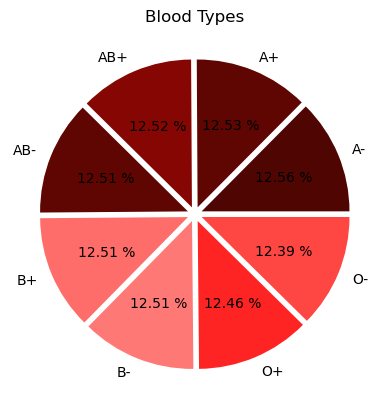

In [10]:
colors=['#4f0602','#5f0602', '#850602', '#5f0602', '#fe6d69', '#fe7976', '#fe2423', '#fe4643']
explode=count*[0.05]
plt.pie(bloods, labels=bloods.index, autopct='%.2f %%', colors=colors, explode=explode)
plt.title('Blood Types')
plt.show()

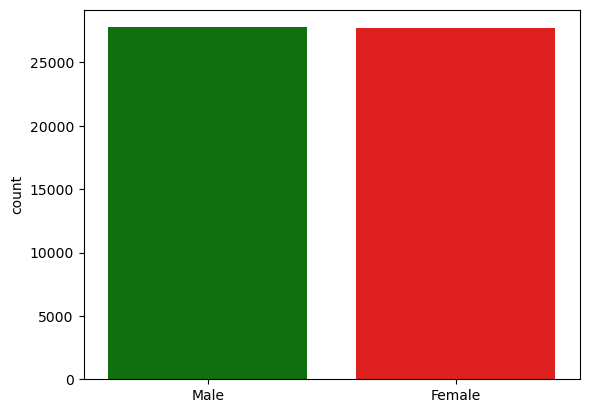

In [11]:
sns.countplot(x=data.Gender, palette=['green', 'red'])
plt.xlabel('')
plt.show()

In [12]:
data.groupby(['Hospital', 'Medical Condition']).agg(Number_of_Patients=('Patient', 'count'))

,,Number_of_Patients
Hospital,Medical Condition,
Abbott Inc,Arthritis,1
Abbott Ltd,Arthritis,1
"Abbott Moore and Williams,",Obesity,1
"Abbott and Thompson, Sullivan",Hypertension,1
"Abbott, Peters and Hoffman",Diabetes,2
"Abbott, Vazquez Bautista and",Obesity,1
Abbott-Castillo,Arthritis,1
Abbott-Coleman,Diabetes,1
Abbott-Ferrell,Asthma,1


In [13]:
data.groupby('Hospital').agg(Total_Billing_Amount=('Billing Amount', 'sum'))

,Total_Billing_Amount
Hospital,
Abbott Inc,3.805204e+04
Abbott Ltd,2.987759e+04
"Abbott Moore and Williams,",2.479960e+04
"Abbott and Thompson, Sullivan",1.673857e+04
"Abbott, Peters and Hoffman",3.768479e+04
"Abbott, Vazquez Bautista and",1.411714e+04
Abbott-Castillo,1.839774e+04
Abbott-Coleman,1.975200e+04
Abbott-Ferrell,9.993358e+01


In [14]:
filtered_data =data[data['Test Results']=='Inconclusive']
condition_result = filtered_data.groupby('Medical Condition').agg(Results=('Test Results', 'count')).reset_index()
most_inc_info = condition_result.sort_values(by='Results', ascending = False).iloc[0]
print(f"The most Inconclusive Patients are from {most_inc_info['Medical Condition']}, count: {most_inc_info['Results']}")

The most Inconclusive Patients are from Hypertension, count: 3091


C:\Users\Asus\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


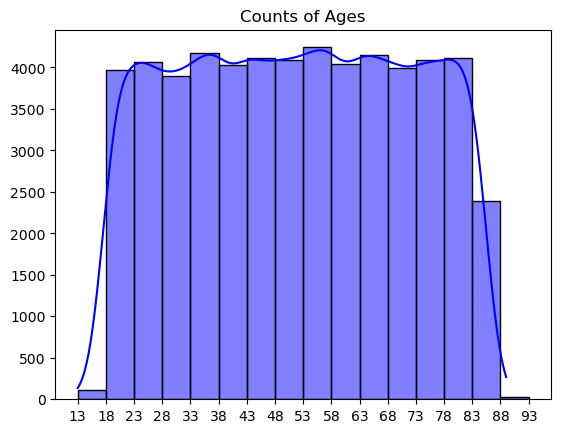

In [15]:
data.replace([np.inf, -np.inf], np.nan, inplace=True)
age_range = np.arange(data['Age'].min(), data['Age'].max() + 5, 5)
sns.histplot(data['Age'], color='blue', kde=True, bins=age_range)
plt.xticks(age_range)
plt.xlabel('')
plt.ylabel('')
plt.title('Counts of Ages')
plt.show()

In [16]:
ins_billing = data.groupby('Insurance Provider').agg(max_bill=('Billing Amount', 'max')).reset_index()
merged_data = pd.merge(data, ins_billing, on='Insurance Provider')

ins_med_billing = merged_data[merged_data['Billing Amount'] == merged_data['max_bill']]
ins_med_billing[['Insurance Provider', 'max_bill', 'Test Results']]

,Insurance Provider,max_bill,Test Results
7277,Blue Cross,52764.27674,Normal
13753,Medicare,52092.66990,Abnormal
23612,Aetna,52211.85297,Inconclusive
40066,UnitedHealthcare,52373.03237,Inconclusive
43406,UnitedHealthcare,52373.03237,Inconclusive
45596,Cigna,52170.03685,Normal
54934,Cigna,52170.03685,Normal


Counts of Healing Patients for Each Year

In [24]:
normal_test_results = data[data['Test Results'] == 'Normal']
discharge_years = normal_test_results['Discharge Date'].dt.year

healing_patients_count = discharge_years.value_counts().reset_index()
healing_patients_count.columns = ['Year', 'Heals_Count']

# Sort the result by Year
healing_patients_count = healing_patients_count.sort_values(by='Year').reset_index(drop=True)

healing_patients_count

,Year,Heals_Count
0,2019,2318
1,2020,3758
2,2021,3647
3,2022,3766
4,2023,3587
5,2024,1441
